In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Load dataset1
dataset1 = pd.read_csv("gold fields1.csv")

# Define columns to exclude (non-numeric)
exclude_columns = ['Date', 'company name']

# Identify all numeric features, including 'closing'
features = [col for col in dataset1.columns if col not in exclude_columns]

# Calculate the mean of only the numeric columns
numeric_means = dataset1[features].mean()

# Fill NaN values using the calculated means
dataset1.fillna(numeric_means, inplace=True)

# Standardization (Z-score normalization)
scaler = StandardScaler()
dataset1[features] = scaler.fit_transform(dataset1[features])

# Save the standardized dataset as dataset2.csv
dataset1.to_csv("gold fields2_normalize.csv", index=False)

print("Standardization complete. Saved as dataset2_including_closing.csv")


Standardization complete. Saved as dataset2_including_closing.csv


/usr/local/lib/python3.11/dist-packages/sklearn/utils/extmath.py:1101: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/usr/local/lib/python3.11/dist-packages/sklearn/utils/extmath.py:1106: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/usr/local/lib/python3.11/dist-packages/sklearn/utils/extmath.py:1126: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
dataset1_updated = pd.read_csv("dataset2_XG.csv")  # Update with the correct path

# Exclude non-numeric columns
exclude_columns = ['Date', 'company name']
numeric_data = dataset1_updated.drop(columns=exclude_columns, errors='ignore')

# Compute the correlation matrix
corr_matrix = numeric_data.corr()

# Display the correlation matrix
print(corr_matrix)

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(120, 120))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix of Continuous Variables")
plt.show()



                                          open      high       low    volume  \
open                                  1.000000  0.989983  0.991620 -0.018784   
high                                  0.989983  1.000000  0.990949  0.021186   
low                                   0.991620  0.990949  1.000000 -0.035865   
volume                               -0.018784  0.021186 -0.035865  1.000000   
closing                               0.979887  0.992559  0.990972  0.003013   
...                                        ...       ...       ...       ...   
std_volume_30                         0.038116  0.045916  0.036913  0.223511   
ROC_30                                0.489459  0.515721  0.502249  0.132241   
gold                                  0.429056  0.441617  0.435204  0.139822   
Economic indicators: inflation rates  0.144408  0.147025  0.139799  0.082061   
Econmic indicators: interest rates   -0.163752 -0.166315 -0.163177 -0.056451   

                                       

In [ ]:
import pandas as pd

# Load the dataset
dataset1_updated = pd.read_csv("dataset2_XG.csv")  # Update with the correct path

# Exclude non-numeric columns
exclude_columns = ['Date', 'company name']
numeric_data = dataset1_updated.drop(columns=exclude_columns, errors='ignore')

# Compute the correlation matrix
corr_matrix = numeric_data.corr()

# Extract correlations with 'closing' and drop 'closing' itself
closing_corr = corr_matrix['closing'].drop('closing', errors='ignore')

# Convert to a DataFrame
correlation_df = closing_corr.reset_index()
correlation_df.columns = ['Variable', 'Correlation with Closing']

# Sort by absolute correlation value in descending order
correlation_df = correlation_df.sort_values(by='Correlation with Closing', ascending=False)

# Display the table
print(correlation_df)

# Optionally, save to a CSV file
correlation_df.to_csv("closing_correlation.csv", index=False)



                               Variable  Correlation with Closing
1                                  high                  0.992559
2                                   low                  0.990972
0                                  open                  0.979887
4                           avg_price_1                  0.978976
9                           avg_price_2                  0.971775
..                                  ...                       ...
77                        std_volume_15                 -0.039521
72                        std_volume_14                 -0.039948
156  Econmic indicators: interest rates                 -0.171977
5                           std_price_1                       NaN
7                          std_volume_1                       NaN

[157 rows x 2 columns]


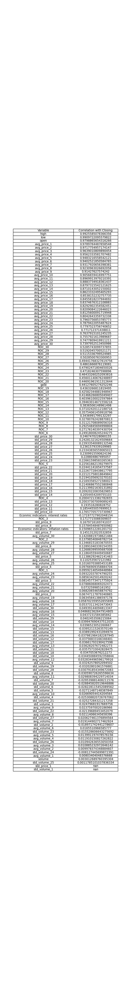

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
dataset1_updated = pd.read_csv("dataset2_XG.csv")  # Update with the correct path

# Exclude non-numeric columns
exclude_columns = ['Date', 'company name']
numeric_data = dataset1_updated.drop(columns=exclude_columns, errors='ignore')

# Compute the correlation matrix
corr_matrix = numeric_data.corr()

# Extract correlations with 'closing' and drop 'closing' itself
closing_corr = corr_matrix['closing'].drop('closing', errors='ignore')

# Convert to a DataFrame
correlation_df = closing_corr.reset_index()
correlation_df.columns = ['Variable', 'Correlation with Closing']

# Sort by absolute correlation value in descending order
correlation_df = correlation_df.reindex(correlation_df['Correlation with Closing'].abs().sort_values(ascending=False).index)

# Create a table image
fig, ax = plt.subplots(figsize=(8, len(correlation_df) * 0.4))  # Adjust figure size based on variable count
ax.axis('tight')
ax.axis('off')

# Create the table
table = ax.table(cellText=correlation_df.values,
                 colLabels=correlation_df.columns,
                 cellLoc='center',
                 loc='center')

# Adjust font size
table.auto_set_font_size(False)
table.set_fontsize(10)
table.auto_set_column_width([0, 1])

# Save as an image
plt.savefig("closing_correlation_table.png", bbox_inches='tight', dpi=300)

# Show the table
plt.show()



In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
dataset1_updated = pd.read_csv("dataset2_XG.csv")  # Update with the correct path

# Exclude non-numeric columns
exclude_columns = ['Date', 'company name']
numeric_data = dataset1_updated.drop(columns=exclude_columns, errors='ignore')

# Compute the correlation matrix
corr_matrix = numeric_data.corr()

# Extract correlations with 'closing' and drop 'closing' itself
closing_corr = corr_matrix['closing'].drop('closing', errors='ignore')

# Convert to a DataFrame
correlation_df = closing_corr.reset_index()
correlation_df.columns = ['Variable', 'Correlation with Closing']

# **Sort by correlation value in descending order**
correlation_df = correlation_df.sort_values(by='Correlation with Closing', ascending=False)

# Split the table into two parts
mid_index = len(correlation_df) // 2
correlation_df_part1 = correlation_df.iloc[:mid_index]  # First half
correlation_df_part2 = correlation_df.iloc[mid_index:]  # Second half

# Function to create and save a table as an image
def save_table_as_image(dataframe, filename):
    fig, ax = plt.subplots(figsize=(8, len(dataframe) * 0.4))  # Adjust figure size
    ax.axis('tight')
    ax.axis('off')

    # Create the table
    table = ax.table(cellText=dataframe.values,
                     colLabels=dataframe.columns,
                     cellLoc='center',
                     loc='center')

    # Adjust font size
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.auto_set_column_width([0, 1])

    # Save as an image
    plt.savefig(filename, bbox_inches='tight', dpi=300)
    plt.close()

# Save both parts as separate images
save_table_as_image(correlation_df_part1, "closing_correlation_table_part1.png")
save_table_as_image(correlation_df_part2, "closing_correlation_table_part2.png")

print("Two images saved: 'closing_correlation_table_part1.png' and 'closing_correlation_table_part2.png'")


Two images saved: 'closing_correlation_table_part1.png' and 'closing_correlation_table_part2.png'


In [ ]:
# Get correlation values with 'closing', excluding 'closing' itself
closing_correlations = corr_matrix["closing"].drop("closing").sort_values(ascending=False)

# Convert to a list of tuples (variable, correlation value)
closing_correlations_list = list(closing_correlations.items())

print(closing_correlations_list)



[('high', 0.9925585078366356), ('low', 0.9909722095579822), ('open', 0.9798865654316266), ('avg_price_1', 0.9789764487658548), ('avg_price_2', 0.9717754957174147), ('avg_price_3', 0.9639010809890454), ('avg_price_4', 0.9562333581707482), ('avg_price_5', 0.9483216558542121), ('avg_price_6', 0.9402521850584765), ('avg_price_7', 0.9317920656398381), ('avg_price_8', 0.9230963026692058), ('avg_price_9', 0.91427627574242), ('avg_price_10', 0.9056659416997751), ('avg_price_11', 0.8969913979210391), ('avg_price_12', 0.8883734918361437), ('avg_price_13', 0.8797315542121625), ('avg_price_14', 0.8710143052150002), ('avg_price_15', 0.8623332495405293), ('avg_price_16', 0.8538152232757735), ('avg_price_17', 0.8455818237944692), ('avg_price_18', 0.8374676312108883), ('avg_price_19', 0.8292902354582451), ('avg_price_20', 0.8209084122646023), ('avg_price_21', 0.8125600091719948), ('avg_price_22', 0.8042643359732338), ('avg_price_23', 0.7960756853785773), ('avg_price_24', 0.7879422055487624), ('avg_pri